## plotly

**`plotly`** es una librería que crea gráficos interactivos de alta calidad.

```html
pip install plotly
```

_**Documentación: https://plotly.com/python-api-reference/**_


|Función                   |Descripción              |
|--------------------------|-------------------------|
|**`px.strip()`**          |Gráfica de "tiras".      |
|**`px.histogram()`**      |Histograma.              |
|**`px.bar()`**            |Gráfico de barras.       |
|**`px.sunburst()`**       |Gráfico de "sol".        |
|**`px.treemap()`**        |Gráfico de mapa de árbol.|
|**`px.line()`**           |Gráfica de rectas.       |
|**`px.scatter()`**        |Gráfica de dispersión.   |
|**`px.box()`**            |Gráfica de cajas.        |
|**`px.violin()`**         |Gráfica de violin.       |
|**`px.pie()`**            |Gráfica de sectores.     |
|**`px.imshow()`**         |Gráfico de calor.        |
|**`px.scatter_ternary()`**|Grafico de 3 variables.  |
|**`px.scatter_3d()`**     |Gráfico en 3D.           |

In [5]:
import numpy as np
import pandas as pd

import plotly.express as px

#### Data

In [2]:
%%time

df1 = pd.read_excel("Data/Airbnb_NYC.xlsx", sheet_name = "NYC1")
df2 = pd.read_excel("Data/Airbnb_NYC.xlsx", sheet_name = "NYC2")

df_airbnb = pd.merge(left = df1, right = df2, left_on = "id", right_on = "id")

df_iris = pd.read_csv("Data/iris.csv")

df_titanic = pd.read_csv("Data/titanic.csv")

df_pokemon = pd.read_csv("Data/Pokemon.csv")

Wall time: 10.4 s


In [3]:
df_pokemon

,#,Name,Type 1,Type 2,Total,HP,Attack,Defense,Sp. Atk,Sp. Def,Speed,Generation,Legendary
0,1,Bulbasaur,Grass,Poison,318,45,49,49,65,65,45,1,False
1,2,Ivysaur,Grass,Poison,405,60,62,63,80,80,60,1,False
2,3,Venusaur,Grass,Poison,525,80,82,83,100,100,80,1,False
3,3,VenusaurMega Venusaur,Grass,Poison,625,80,100,123,122,120,80,1,False
4,4,Charmander,Fire,NaN,309,39,52,43,60,50,65,1,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...
795,719,Diancie,Rock,Fairy,600,50,100,150,100,150,50,6,True
796,719,DiancieMega Diancie,Rock,Fairy,700,50,160,110,160,110,110,6,True
797,720,HoopaHoopa Confined,Psychic,Ghost,600,80,110,60,150,130,70,6,True
798,720,HoopaHoopa Unbound,Psychic,Dark,680,80,160,60,170,130,80,6,True


#### Strip Plot
**`px.strip()`**

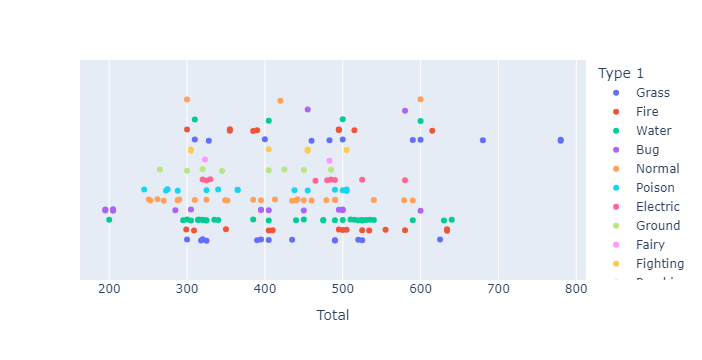

In [4]:
px.strip(data_frame = df_pokemon[df_pokemon["Generation"] == 1],
         x          = "Total",
         color      = "Type 1",
         hover_data = df_pokemon.columns)

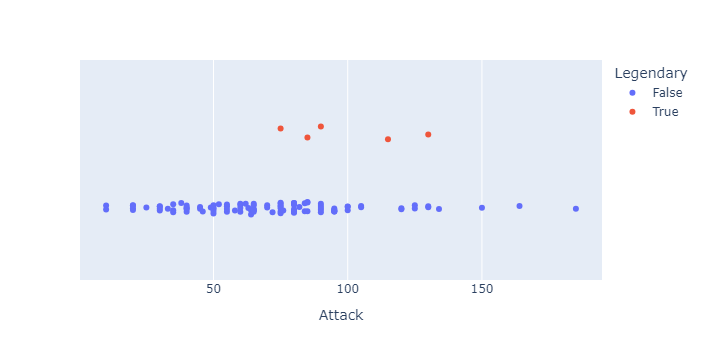

In [16]:
# Pokemon

px.strip(data_frame = df_pokemon[df_pokemon["Generation"] == 2],
         x          = "Attack",
         hover_data = [df_pokemon[df_pokemon["Generation"] == 2].index, "Name"],
         color      = "Legendary")

#### Histogram
**`px.histogram()`**

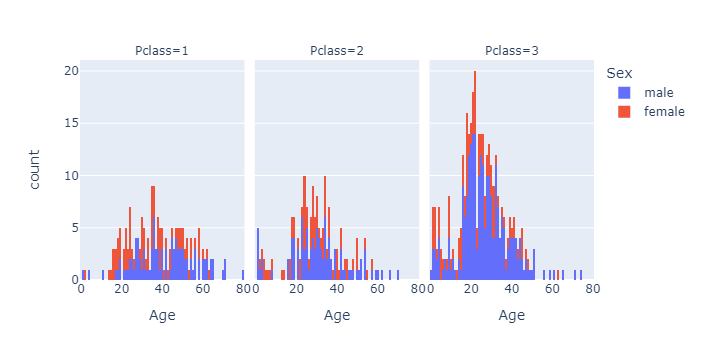

In [9]:
px.histogram(data_frame = df_titanic.sort_values("Pclass"), 
             x          = "Age",
             color      = "Sex",
             facet_col  = "Pclass",
             nbins      = 100)

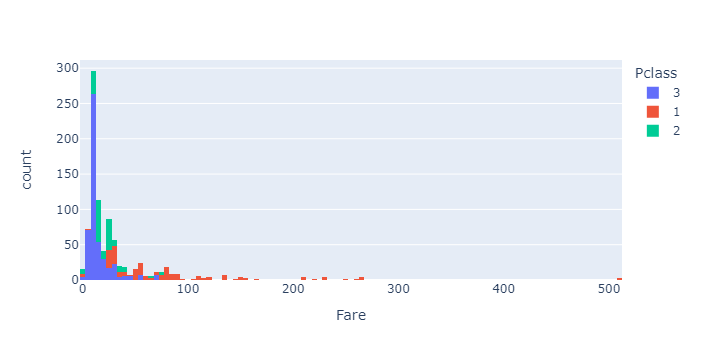

In [10]:
# Titanic

px.histogram(data_frame = df_titanic,
             x          = "Fare",
             hover_data = ["Pclass"],
             color      = "Pclass",
             nbins      = 200)

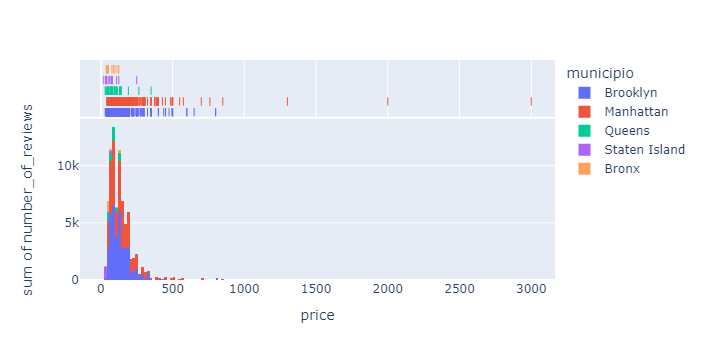

In [11]:
# Airbnb - marginal & y

px.histogram(data_frame = df_airbnb.iloc[:1000, :],
             x          = "price",
             y          = "number_of_reviews", 
             hover_data = ["municipio"],
             color      = "municipio",
             nbins      = 200,
             marginal   = "rug")

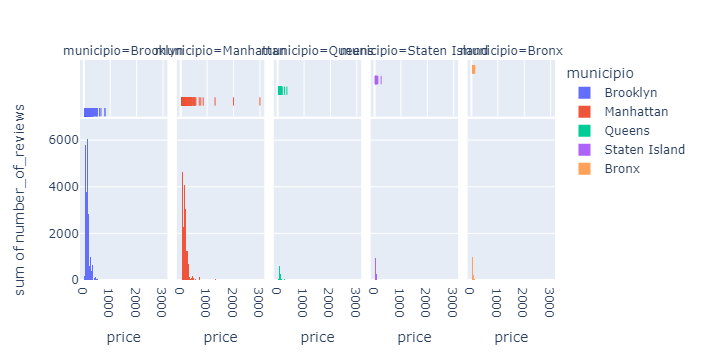

In [12]:
# Airbnb - facet_col
px.histogram(data_frame = df_airbnb.iloc[:1000, :],
             x          = "price",
             y          = "number_of_reviews", 
             hover_data = ["municipio"],
             color      = "municipio",
             nbins      = 200,
             marginal   = "rug",
             facet_col = "municipio")

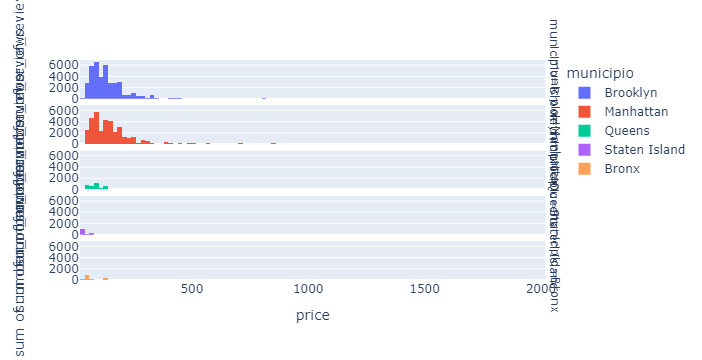

In [13]:
# Airbnb - facet_row
px.histogram(data_frame = df_airbnb.iloc[:1000, :],
             x          = "price",
             y          = "number_of_reviews", 
             hover_data = ["municipio"],
             color      = "municipio",
             nbins      = 200,
             marginal   = "rug",
             facet_row = "municipio")

#### Bar plot
**`px.bar()`**

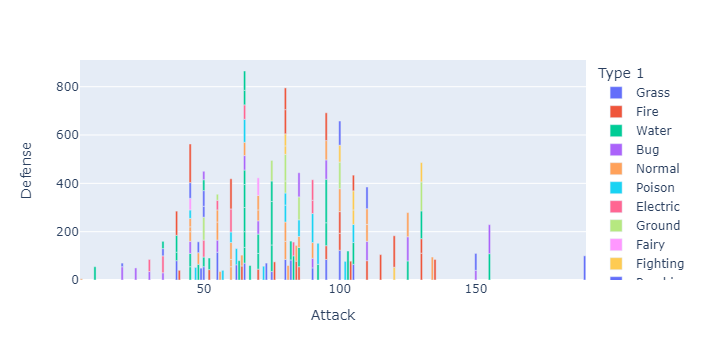

In [14]:
px.bar(data_frame = df_pokemon[df_pokemon["Generation"] == 1],
       x          = "Attack",
       y          = "Defense",
       hover_data = ["Name", "Sp. Atk"],
       color      = "Type 1")

#### Sunburst Chart
**`px.sunburst()`**

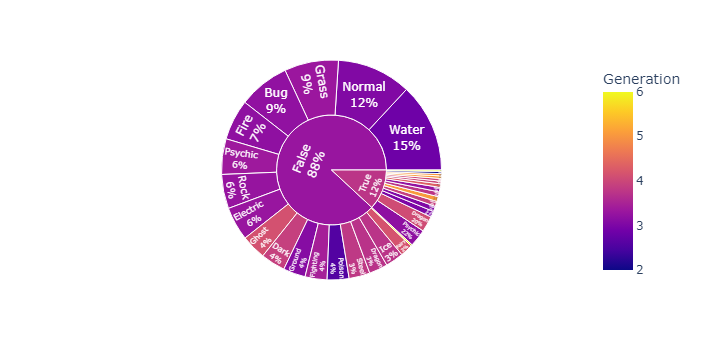

In [17]:
# Pokemon

fig = px.sunburst(data_frame = df_pokemon,
                  values     = "Total",
                  path       = ["Legendary", "Type 1"],
                  hover_name = "Name",
                  color      = "Generation")

fig.update_traces(textinfo = "label+percent parent")

fig

#### Treemap plot
**`px.treemap()`**

In [18]:
df_airbnb

,id,name,host_id,host_name,municipio,barrio,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149.0,1.0,9.0,2018-10-19,0.21,6.0,365.0
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225.0,1.0,45.0,2019-05-21,0.38,2.0,355.0
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150.0,3.0,0.0,NaT,NaN,1.0,365.0
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89.0,1.0,270.0,2019-07-05,4.64,1.0,194.0
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80.0,10.0,9.0,2018-11-19,0.10,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48890,36484665,Charming one bedroom - newly renovated rowhouse,8232441,Sabrina,Brooklyn,Bedford-Stuyvesant,40.67853,-73.94995,Private room,70.0,2.0,0.0,NaT,NaN,2.0,9.0
48891,36485057,Affordable room in Bushwick/East Williamsburg,6570630,Marisol,Brooklyn,Bushwick,40.70184,-73.93317,Private room,40.0,4.0,0.0,NaT,NaN,2.0,36.0
48892,36485431,Sunny Studio at Historical Neighborhood,23492952,Ilgar & Aysel,Manhattan,Harlem,40.81475,-73.94867,Entire home/apt,115.0,10.0,0.0,NaT,NaN,1.0,27.0
48893,36485609,43rd St. Time Square-cozy single bed,30985759,Taz,Manhattan,Hell's Kitchen,40.75751,-73.99112,Shared room,55.0,1.0,0.0,NaT,NaN,6.0,2.0


In [33]:
df_arb_grp = df_airbnb.groupby(['municipio', 'barrio']).mean()
df_arb_grp.reset_index(inplace=True)
df_arb_grp = df_arb_grp[['municipio','barrio', 'price','minimum_nights']]

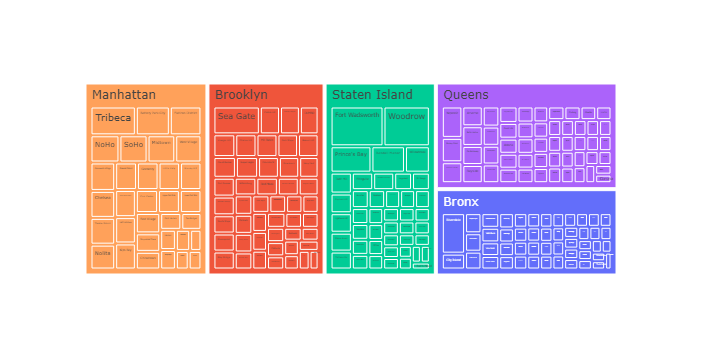

In [36]:
px.treemap(data_frame = df_arb_grp,
           values     = "price",
           path       = ["municipio", "barrio"],
           hover_name = "barrio",
           color      = "municipio",
           hover_data = ['municipio', 'price']
       )

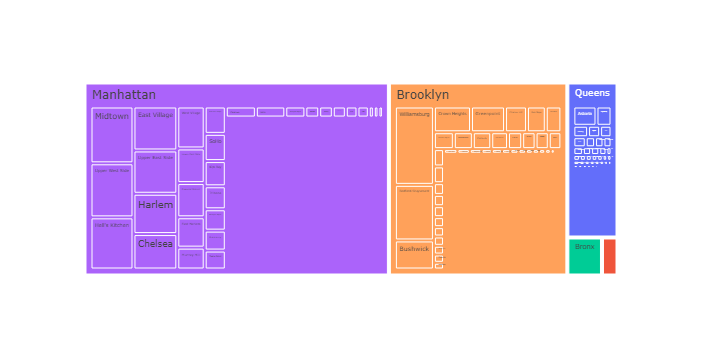

In [21]:
# Airbnb - Mismos parámetros de sunburst

px.treemap(data_frame = df_airbnb,
           values     = "price",
           path       = ["municipio", "barrio"],
           hover_name = "name",
           color      = "municipio",
           branchvalues= 'remainder')

#### Line Plot
**`px.line()`**

In [37]:
df_iris

,Largo Sepalo,Ancho Sepalo,Largo Petalo,Ancho Petalo,Clase
0,5.1,3.5,1.4,0.2,Iris-setosa
1,4.9,3.0,1.4,0.2,Iris-setosa
2,4.7,3.2,1.3,0.2,Iris-setosa
3,4.6,3.1,1.5,0.2,Iris-setosa
4,5.0,3.6,1.4,0.2,Iris-setosa
...,...,...,...,...,...
145,6.7,3.0,5.2,2.3,Iris-virginica
146,6.3,2.5,5.0,1.9,Iris-virginica
147,6.5,3.0,5.2,2.0,Iris-virginica
148,6.2,3.4,5.4,2.3,Iris-virginica


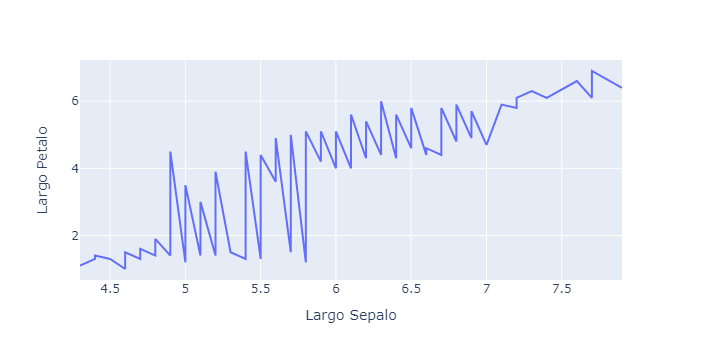

In [38]:
px.line(data_frame = df_iris.sort_values(["Largo Sepalo", "Largo Petalo"]),
        x = "Largo Sepalo",
        y = "Largo Petalo",
        hover_data = ["Clase"])

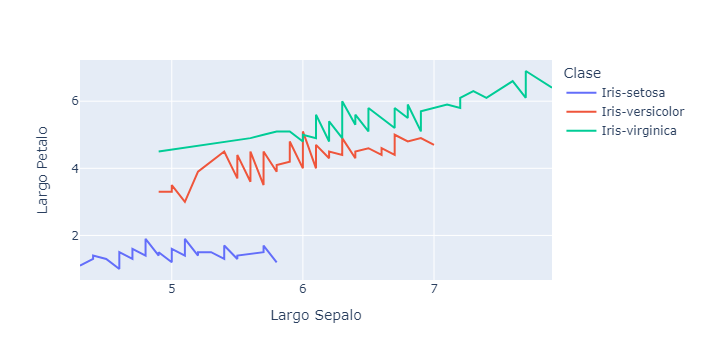

In [39]:
px.line(data_frame = df_iris.sort_values(["Largo Sepalo", "Largo Petalo"]),
        x = "Largo Sepalo",
        y = "Largo Petalo",
        color = "Clase")

#### Scatter Plot
**`px.scatter()`**

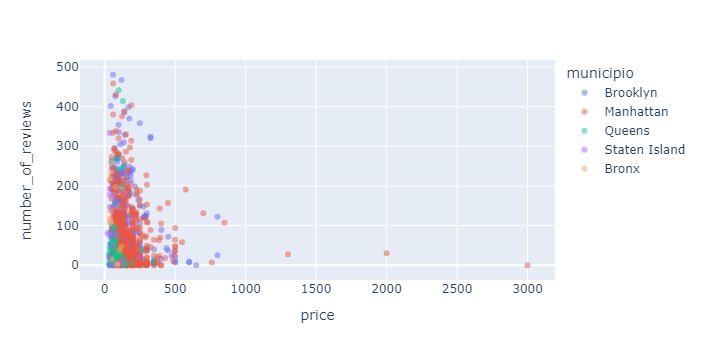

In [40]:
# Airbnb

px.scatter(data_frame  = df_airbnb.iloc[:1000, :],
           x           = "price",
           y           = "number_of_reviews",
           color       = "municipio",
           hover_name  = "name",
           width       = None,
           height      = None,
           opacity     = 0.5)

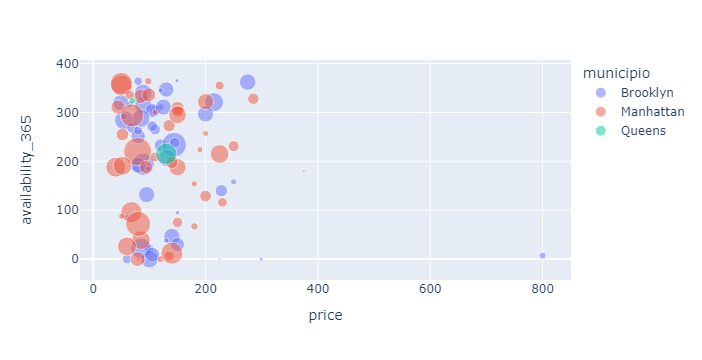

In [41]:
# Airbnb - Bubble chart

px.scatter(data_frame  = df_airbnb.iloc[:100, :],
           x           = "price",
           y           = "availability_365",
           color       = "municipio",
           hover_name  = "name",
           opacity     = 0.5,
           size        = "number_of_reviews")

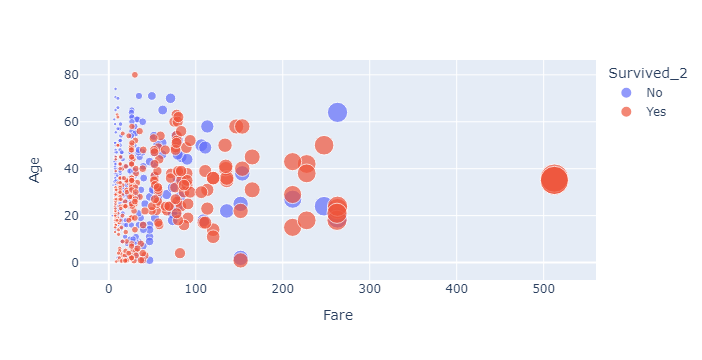

In [44]:
# Titanic - Bubble Chart

df_titanic["Survived_2"] = df_titanic["Survived"].apply(lambda x : "Yes" if x == 1 else "No")

px.scatter(data_frame  = df_titanic,
           x           = "Fare",
           y           = "Age",
           hover_name  = "Name",
#            color       = "Survived",
           color       = "Survived_2",
           size        = "Fare",
           #size_max    = 20
          )

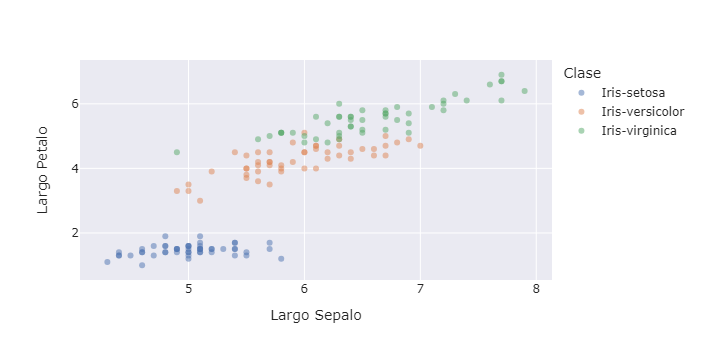

In [47]:
# Iris

px.scatter(data_frame = df_iris,
           x          = "Largo Sepalo",
           y          = "Largo Petalo",
           color      = "Clase",
           hover_name = "Clase",
           opacity    = 0.5,
           template = "seaborn")

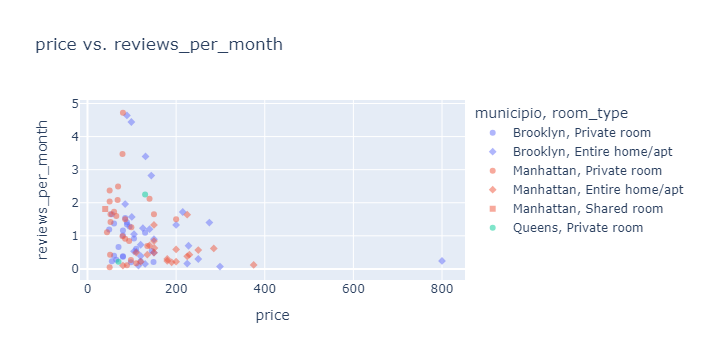

In [48]:
# Airbnb

px.scatter(data_frame = df_airbnb.iloc[:100, :],
           x          = "price",
           y          = "reviews_per_month",
           color      = "municipio",
           symbol     = "room_type",
           opacity    = 0.5,
           hover_name = "name",
           title      = "price vs. reviews_per_month")

#### Box Plot
**`px.box()`**

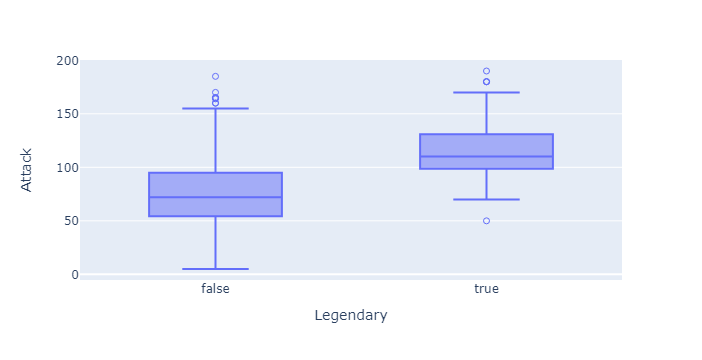

In [61]:
# Pokemon
px.box(data_frame = df_pokemon,
       x          = "Legendary",
       y          = "Attack",
#       color      = "Type 1",
#       facet_col  = "Generation",
       points     = "suspectedoutliers",
       hover_name = "Name",
       hover_data = df_pokemon.columns #datos a mostrar cuando pasemos el ratón por encima
      )

# points : 'outliers', 'suspectedoutliers', 'all', False

#### Violin Plot
**`px.violin()`**

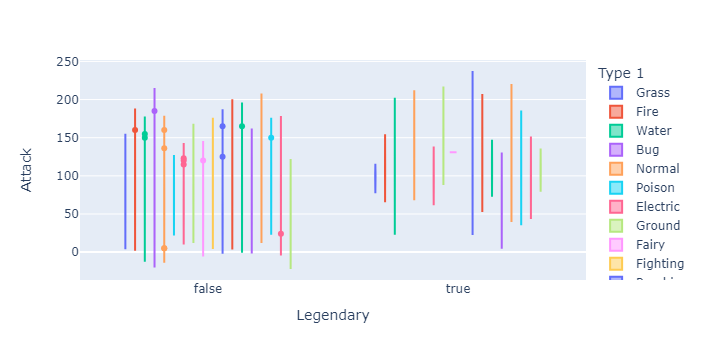

In [63]:
# Pokemon

px.violin(data_frame = df_pokemon,
          x          = "Legendary",
          y          = "Attack",
          color      = "Type 1",
#          facet_col  = "Generation",
          hover_name = "Name")

#### Pie Plot
**`px.pie()`**

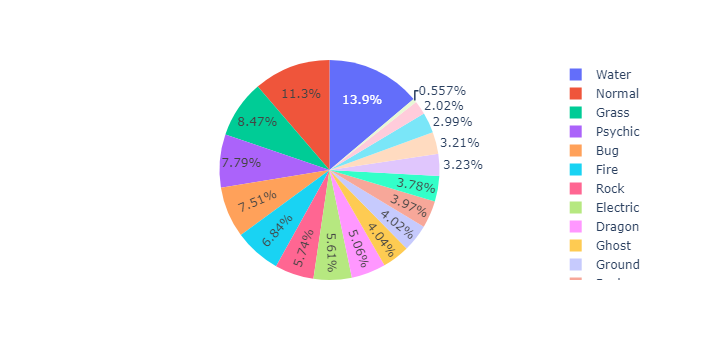

In [64]:
# Pokemon

px.pie(data_frame = df_pokemon,
       names      = "Type 1",
       values     = "Total")

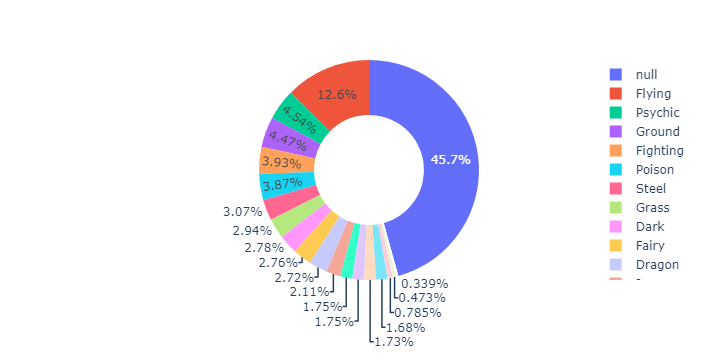

In [65]:
# Pokemon

px.pie(data_frame = df_pokemon,
       names      = "Type 2",
       values     = "Total",
       hole       = 0.5)

#### Heatmap Plot
**`px.imshow()`**

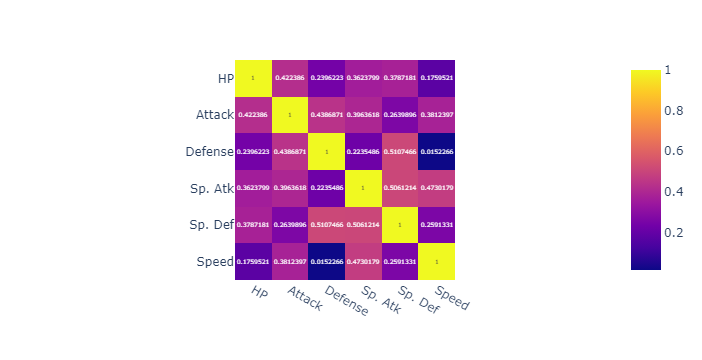

In [66]:
px.imshow(img       = df_pokemon[["HP", "Attack", "Defense", "Sp. Atk", "Sp. Def", "Speed"]].corr(),
          text_auto = True)

#### Guardar Figura

**`fig.write_image()`**

**`fig.write_html()`**

**`fig.write_json()`**


**Nota**: Para poder usar estos métodos debemos tener instalado la librería **`kaleido`**.

```html
pip install kaleido
```

In [69]:
fig2 = px.treemap(data_frame = df_arb_grp,
           values     = "price",
           path       = ["municipio", "barrio"],
           hover_name = "barrio",
           color      = "municipio",
           hover_data = ['municipio', 'price']
       )
fig2
fig2.write_html("airbnb_mean_price_treemap.html")

In [70]:
fig = px.scatter(data_frame  = df_airbnb.iloc[:1000, :],
                 x           = "price",
                 y           = "availability_365",
                 color       = "municipio",
                 hover_name  = "name",
                 opacity     = 0.5,
                 size        = "price")

fig

# fig.write_image("airbnb_bubble_chart.svg") # imagen estática
fig.write_html("airbnb_bubble_chart.html") # html interactivo
fig.write_json("airbnb_bubble_chart.json") # archivo json

In [2]:
import json
from pprint import pprint

with open("airbnb_bubble_chart.json", "r") as file:
    data = json.load(file)
    
pprint(data)

{'data': [{'hovertemplate': '<b>%{hovertext}</b><br><br>municipio=Brooklyn<br>price=%{marker.size}<br>availability_365=%{y}<extra></extra>',
           'hovertext': ['Clean & quiet apt home by the park',
                         'Cozy Entire Floor of Brownstone',
                         'BlissArtsSpace!',
                         'Lovely Room 1, Garden, Best Area, Legal rental',
                         'Only 2 stops to Manhattan studio',
                         'Perfect for Your Parents + Garden',
                         'Hip Historic Brownstone Apartment with Backyard',
                         'Sweet and Spacious Brooklyn Loft',
                         'CBG CtyBGd HelpsHaiti rm#1:1-4',
                         'CBG Helps Haiti Room#2.5',
                         'CBG Helps Haiti Rm #2',
                         'MAISON DES SIRENES1,bohemian apartment',
                         'Sunny Bedroom Across Prospect Park',
                         'Loft in Williamsburg Area w/ Roof',
   

#### Scatter Ternary
**`px.scatter_ternary()`**

In [76]:
columns = ["municipio","barrio", "calculated_host_listings_count", "minimum_nights", "number_of_reviews", "availability_365"]

df_airbnb2 = df_airbnb.groupby(["municipio", "barrio"], as_index = False).mean()[columns]

df_airbnb2

,municipio,barrio,calculated_host_listings_count,minimum_nights,number_of_reviews,availability_365
0,Bronx,Allerton,2.761905,2.214286,42.928571,163.666667
1,Bronx,Baychester,1.714286,2.428571,44.285714,157.857143
2,Bronx,Belmont,1.583333,3.375000,12.333333,187.666667
3,Bronx,Bronxdale,1.105263,2.894737,24.105263,145.421053
4,Bronx,Castle Hill,5.666667,2.333333,13.111111,159.333333
...,...,...,...,...,...,...
216,Staten Island,Tottenville,1.285714,2.428571,19.857143,267.571429
217,Staten Island,West Brighton,2.888889,5.166667,36.444444,274.722222
218,Staten Island,Westerleigh,1.000000,2.500000,9.000000,112.500000
219,Staten Island,Willowbrook,2.000000,4.000000,9.000000,351.000000


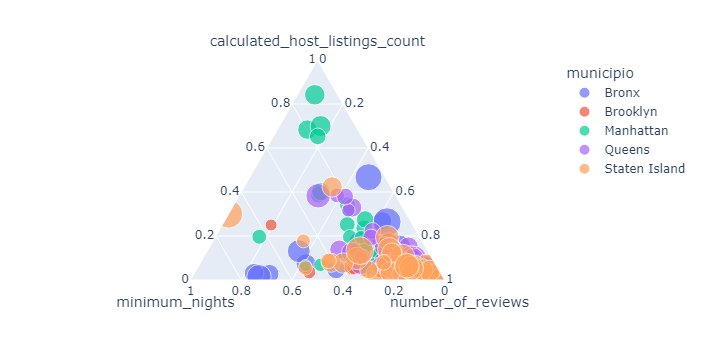

In [77]:
# Airbnb

px.scatter_ternary(data_frame = df_airbnb2,
                   a          = "calculated_host_listings_count",
                   b          = "minimum_nights",
                   c          = "number_of_reviews",
                   size       = "availability_365",
                   hover_name = "municipio",
                   color      = "municipio")

#### Scatter 3D
**`px.scatter_3d`**

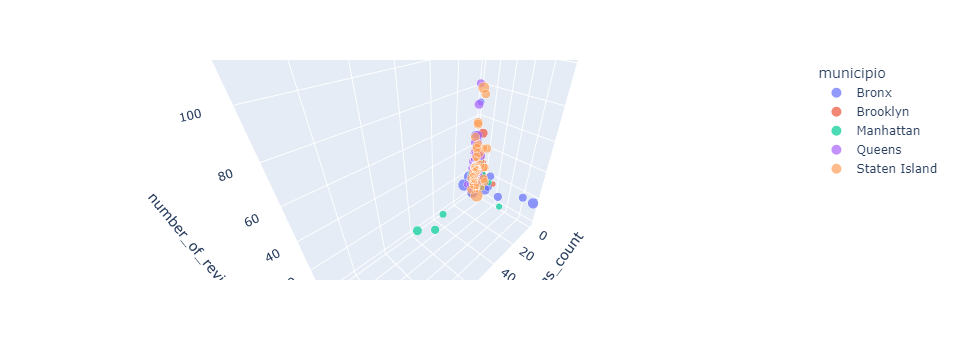

In [78]:
# Airbnb
px.scatter_3d(data_frame = df_airbnb2,
              x          = "calculated_host_listings_count",
              y          = "minimum_nights",
              z          = "number_of_reviews",
              size       = "availability_365",
              hover_name = "municipio",
              color      = "municipio")

In [80]:
df_airbnb2.head()

,municipio,barrio,calculated_host_listings_count,minimum_nights,number_of_reviews,availability_365
0,Bronx,Allerton,2.761905,2.214286,42.928571,163.666667
1,Bronx,Baychester,1.714286,2.428571,44.285714,157.857143
2,Bronx,Belmont,1.583333,3.375000,12.333333,187.666667
3,Bronx,Bronxdale,1.105263,2.894737,24.105263,145.421053
4,Bronx,Castle Hill,5.666667,2.333333,13.111111,159.333333


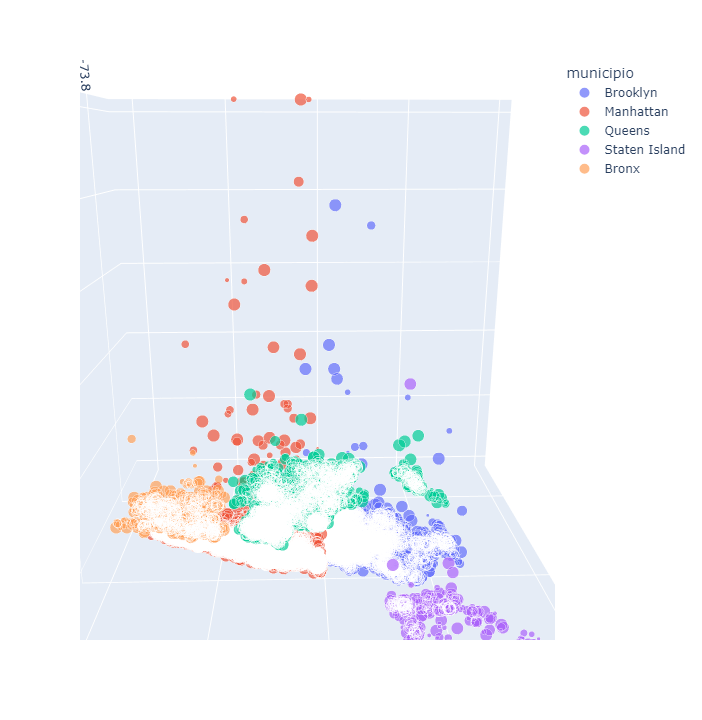

In [82]:
px.scatter_3d(data_frame = df_airbnb,
              x          = "longitude",
              y          = "latitude",
              z          = "price",
              size       = "availability_365",
              hover_name = "municipio",
              color      = "municipio",
              width      = 1080,
              height     = 720
             )

In [ ]:
################################################################################################################################